<h1 style="text-align: center;color:#222"; > Predicting Graduate School Admission Using Machine Learning Algorithms

Dataset has been downloaded from [Kaggle](https://www.kaggle.com/datasets/mohansacharya/graduate-admissions)

-----------------------

<b> Wassem Alaa Iddin </b>

----------------

### Abstarct 

<p style="text-align: justify;">The dataset "Predicting Graduate School Admission" comprises information from students who applied to graduate programs at various universities. The objective is to create a predictive model that can forecast whether or not a student will be admitted to a given university. The dataset contains information on the student's GRE scores, GPA, and undergraduate institution rank. The assignment may be handled as a supervised learning problem, with the goal variable indicating whether or not the student got admitted; this dataset provides an intriguing challenge for developing a prediction model and may be used to compare the performance of various machine learning techniques.

-------------

## Downloading the needed Libraries

In [1]:
#!pip install matplotlib seaborn plotly bokeh scikit-learn sweetviz pandas-profiling pickle
#!pip install scikit-learn matplotlib

------

## Importing the needed libraries

In [2]:
import warnings
warnings.filterwarnings("ignore")

import random
import numpy as np
import pandas as pd
import matplotlib
import matplotlib.pyplot as plt
import seaborn as sns
import plotly
import plotly.express as px
import sweetviz as sv
from pandas_profiling import ProfileReport 

import sklearn

from sklearn.metrics import classification_report
from sklearn.model_selection import train_test_split
from sklearn.metrics import accuracy_score, confusion_matrix
from sklearn.linear_model import LogisticRegression
from sklearn.tree import DecisionTreeClassifier
from sklearn.ensemble import RandomForestClassifier
from sklearn.svm import SVC
from sklearn.neighbors import KNeighborsClassifier
from sklearn.preprocessing import MinMaxScaler
from sklearn.linear_model import LogisticRegression
from sklearn import metrics
from sklearn.metrics import accuracy_score
from sklearn.preprocessing import OneHotEncoder
from sklearn.preprocessing import StandardScaler

from keras.layers import Dropout
from keras.models import Sequential
from keras.layers import Dense

import tensorflow as tf
from tensorflow import keras

import pickle

#### show the version of all the libraries

In [3]:
print("numpy version:", np.__version__)
print("pandas version:", pd.__version__)
print("matplotlib version:", matplotlib.__version__)
print("seaborn version:", sns.__version__)
print("plotly version:", plotly.__version__)
print("sklearn version:", sklearn.__version__)
print("tensorflow version:", tf.__version__)
print("keras version:", keras.__version__)

numpy version: 1.21.5
pandas version: 1.4.4
matplotlib version: 3.5.2
seaborn version: 0.11.2
plotly version: 5.9.0
sklearn version: 1.0.2
tensorflow version: 2.9.1
keras version: 2.9.0


-----

## Dataset

#### Importing the Dataset

In [4]:
# Import the CSV file
Dataset = pd.read_csv('Dataset/Admission_Predict.csv')

In [5]:
#Showing the dataset
Dataset.head(5)

,Serial No.,GRE Score,TOEFL Score,University Rating,SOP,LOR,CGPA,Research,Chance of Admit
0,1,337,118,4,4.5,4.5,9.65,1,0.92
1,2,324,107,4,4.0,4.5,8.87,1,0.76
2,3,316,104,3,3.0,3.5,8.00,1,0.72
3,4,322,110,3,3.5,2.5,8.67,1,0.80
4,5,314,103,2,2.0,3.0,8.21,0,0.65


#### Cleaning the dataset

In [6]:
Dataset.shape

(300, 9)

In [7]:
#Passing a value to carry the columns which will be dropped
columnsToDrop = ['Serial No.']

# Dropping the unneeded columns from axis 1 as its on the first line of the dataset
Dataset = Dataset.drop(columnsToDrop,axis=1)

In [8]:
Dataset.shape

(300, 8)

In [9]:
Dataset.columns

Index(['GRE Score', 'TOEFL Score', 'University Rating', 'SOP', 'LOR ', 'CGPA',
       'Research', 'Chance of Admit '],
      dtype='object')

In [10]:
#Since we have an empty space after 'Chance of Admit' and LOR, the names will be modified to fulfil the space

Dataset.rename({'Chance of Admit ': 'Chance of Admit', 'LOR ':'LOR'}, axis=1, inplace=True)

In [11]:
Dataset.columns

Index(['GRE Score', 'TOEFL Score', 'University Rating', 'SOP', 'LOR', 'CGPA',
       'Research', 'Chance of Admit'],
      dtype='object')

In [12]:
Dataset.isnull().sum()

GRE Score            0
TOEFL Score          0
University Rating    0
SOP                  0
LOR                  0
CGPA                 0
Research             0
Chance of Admit      0
dtype: int64

<AxesSubplot:>

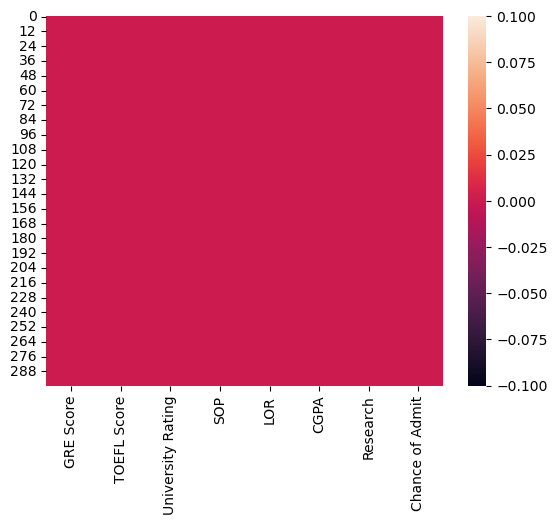

In [13]:
sns.heatmap(Dataset.isnull())

--------------------

-----------------

## Analyzing the dataset

#### Analyzing the dataset in general

In [14]:
Dataset.columns.values

array(['GRE Score', 'TOEFL Score', 'University Rating', 'SOP', 'LOR',
       'CGPA', 'Research', 'Chance of Admit'], dtype=object)

In [15]:
# detailed information on the dataset
Dataset.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 300 entries, 0 to 299
Data columns (total 8 columns):
 #   Column             Non-Null Count  Dtype  
---  ------             --------------  -----  
 0   GRE Score          300 non-null    int64  
 1   TOEFL Score        300 non-null    int64  
 2   University Rating  300 non-null    int64  
 3   SOP                300 non-null    float64
 4   LOR                300 non-null    float64
 5   CGPA               300 non-null    float64
 6   Research           300 non-null    int64  
 7   Chance of Admit    300 non-null    float64
dtypes: float64(4), int64(4)
memory usage: 18.9 KB


In [16]:
# The summary statistics of the Dataste
Dataset.describe().T

,count,mean,std,min,25%,50%,75%,max
GRE Score,300.0,316.800000,11.741075,290.00,308.0000,317.000,325.0000,340.00
TOEFL Score,300.0,107.403333,6.065472,92.00,103.0000,107.000,112.0000,120.00
University Rating,300.0,3.106667,1.157478,1.00,2.0000,3.000,4.0000,5.00
SOP,300.0,3.380000,1.006135,1.00,2.5000,3.500,4.0000,5.00
LOR,300.0,3.411667,0.889194,1.00,3.0000,3.500,4.0000,5.00
CGPA,300.0,8.569467,0.616453,6.80,8.1275,8.560,9.0525,9.92
Research,300.0,0.556667,0.497609,0.00,0.0000,1.000,1.0000,1.00
Chance of Admit,300.0,0.715800,0.150545,0.34,0.6200,0.725,0.8300,0.97


In [17]:
def analyze(Dataset):
    print()
    cols = Dataset.columns.values
    total = float(len(Dataset))

    print("{} Total Number of Rows\n".format(int(total)))
    for col in cols:
        uniques = Dataset[col].unique()
        unique_count = len(uniques)
        if unique_count > 1:
            print("{}: {} Unique Data \n".format(col,unique_count))
        else:
            pass

analyze(Dataset)


300 Total Number of Rows

GRE Score: 49 Unique Data 

TOEFL Score: 29 Unique Data 

University Rating: 5 Unique Data 

SOP: 9 Unique Data 

LOR: 9 Unique Data 

CGPA: 148 Unique Data 

Research: 2 Unique Data 

Chance of Admit: 59 Unique Data 



Text(0.5, 1.0, 'Correlation Heat Map')

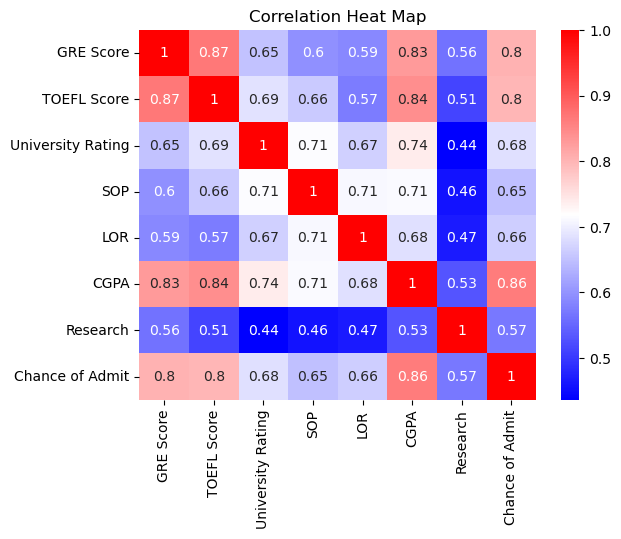

In [18]:
## Correlation heatmap
sns.heatmap(Dataset.corr(), annot=True, cmap='bwr').set_title('Correlation Heat Map')

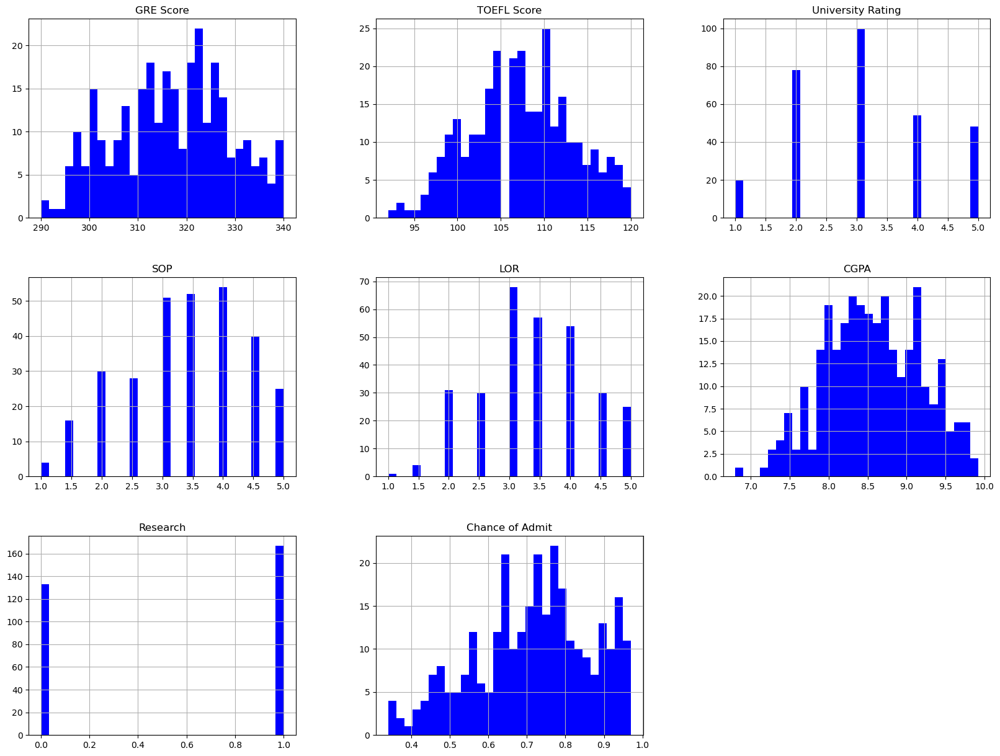

In [19]:
# Plot histograms of the features
Dataset.hist(bins=30, figsize=(20,15), color='blue')
plt.show()

#### Analyzing The Resarch Column

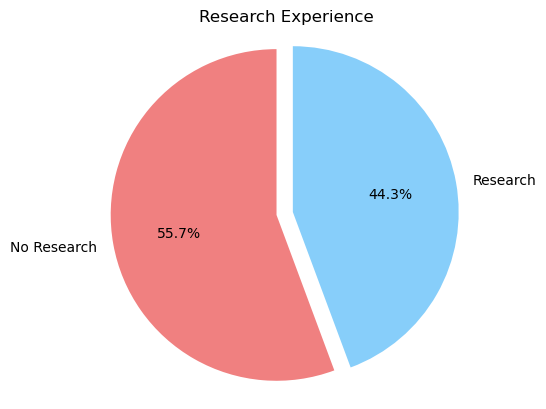

In [20]:
# Count the number of students who did and did not do research
research_count = Dataset['Research'].value_counts()

# Create a pie chart showing the distribution of the 'Research' column
labels = ['No Research', 'Research']
sizes = research_count.values
colors = ['lightcoral', 'lightskyblue']
explode = (0, 0.1)

plt.pie(sizes, explode=explode, labels=labels, colors=colors,
        autopct='%1.1f%%', startangle=90)
plt.axis('equal')
plt.title('Research Experience')
plt.show()

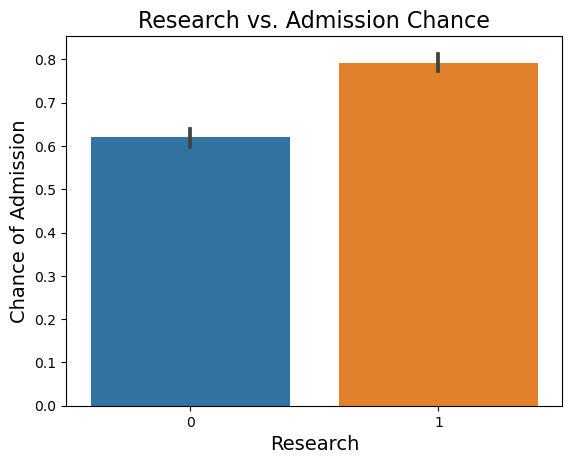

In [21]:
sns.barplot(x='Research', y='Chance of Admit', data=Dataset)
plt.title('Research vs. Admission Chance', size=16)
plt.xlabel('Research', size=14)
plt.ylabel('Chance of Admission', size=14)
plt.show()

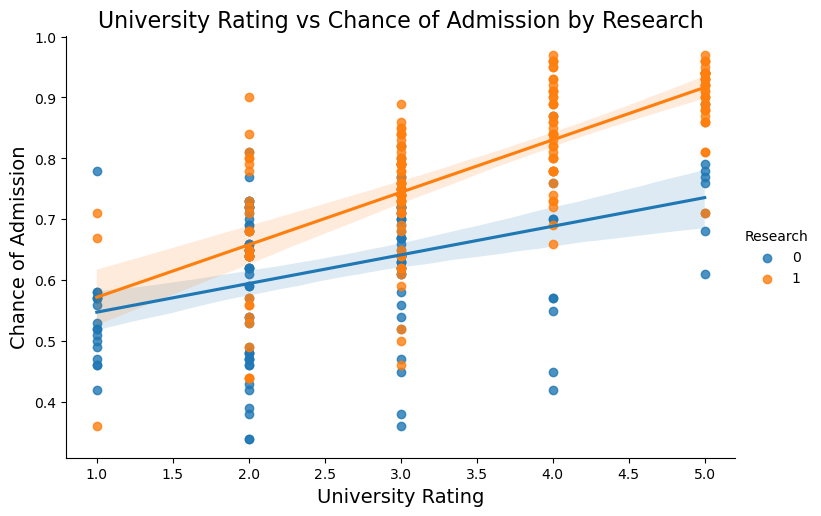

In [22]:
# Creating a scatterplot with regression line
sns.lmplot(x="University Rating", y="Chance of Admit", data=Dataset, hue="Research", height=5, aspect=1.5)
plt.title('University Rating vs Chance of Admission by Research', size=16)
plt.xlabel('University Rating', size=14)
plt.ylabel('Chance of Admission', size=14)
plt.show()


----

#### Analyzing each exam Score column 

GRE

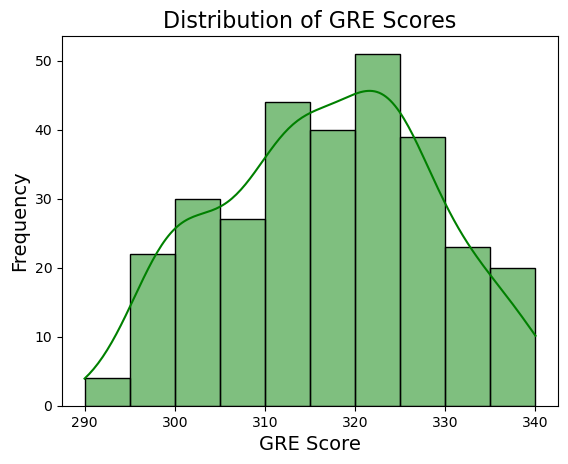

In [23]:
# Probability distribution plot
gre = Dataset['GRE Score']
sns.histplot(data=gre, kde=True, color='green')
plt.title("Distribution of GRE Scores", fontsize=16)
plt.xlabel("GRE Score", fontsize=14)
plt.ylabel("Frequency", fontsize=14)
plt.show()

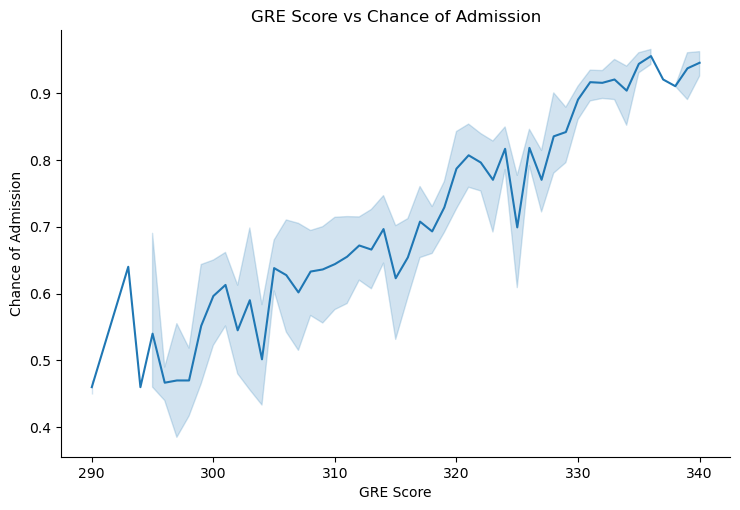

In [24]:
plot = sns.relplot(x="GRE Score", y="Chance of Admit", data=Dataset, kind="line", height=5, aspect=1.5)
plot.set(title='GRE Score vs Chance of Admission', xlabel='GRE Score', ylabel='Chance of Admission')
plt.show()

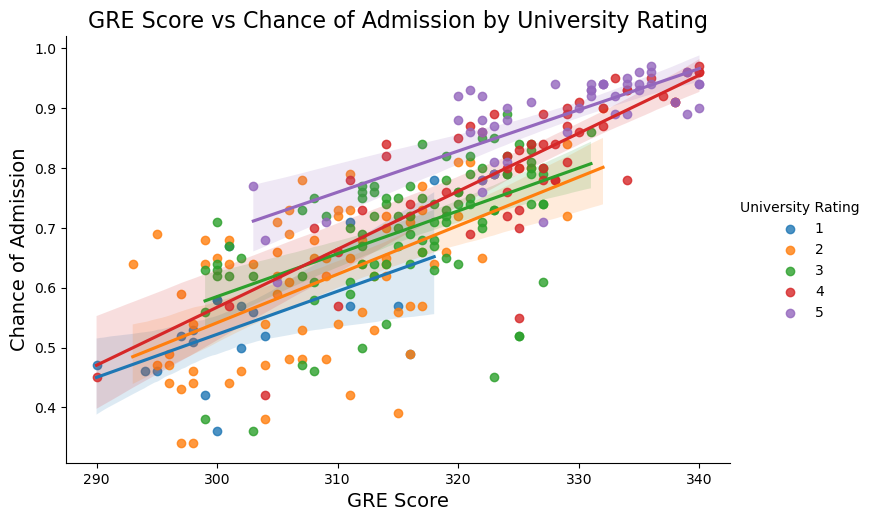

In [25]:
# Creating a scatterplot with regression line
sns.lmplot(x="GRE Score", y="Chance of Admit", data=Dataset, hue="University Rating", height=5, aspect=1.5)
plt.title('GRE Score vs Chance of Admission by University Rating', size=16)
plt.xlabel('GRE Score', size=14)
plt.ylabel('Chance of Admission', size=14)
plt.show()

TOEFL

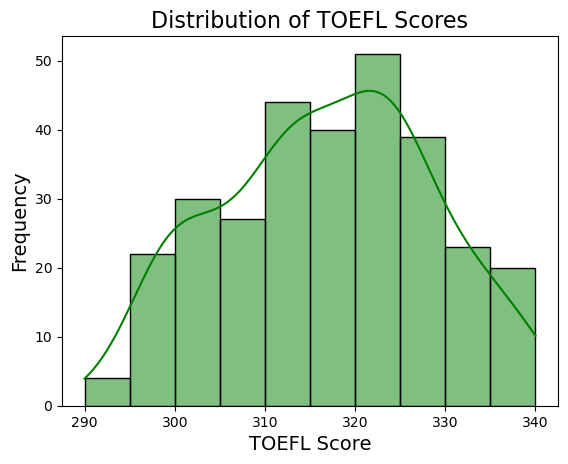

In [26]:
# Probability distribution plot
sns.histplot(data=gre, kde=True, color='green')
plt.title("Distribution of TOEFL Scores", fontsize=16)
plt.xlabel("TOEFL Score", fontsize=14)
plt.ylabel("Frequency", fontsize=14)
plt.show()

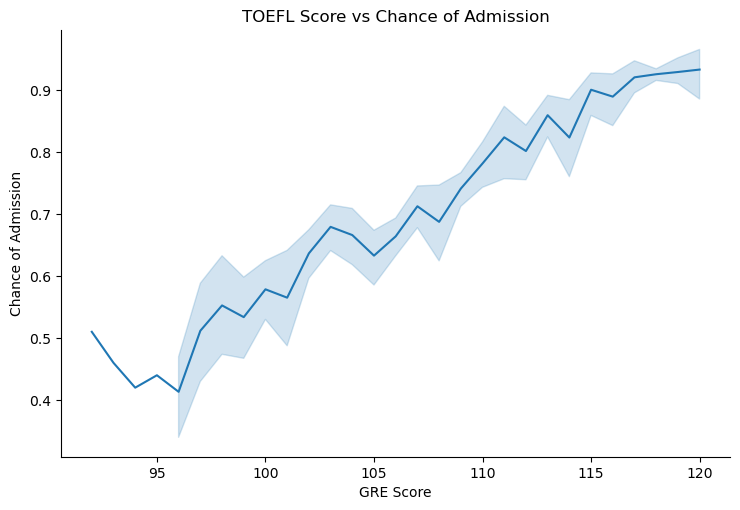

In [27]:
plot = sns.relplot(x="TOEFL Score", y="Chance of Admit", data=Dataset, kind="line", height=5, aspect=1.5)
plot.set(title='TOEFL Score vs Chance of Admission', xlabel='GRE Score', ylabel='Chance of Admission')
plt.show()

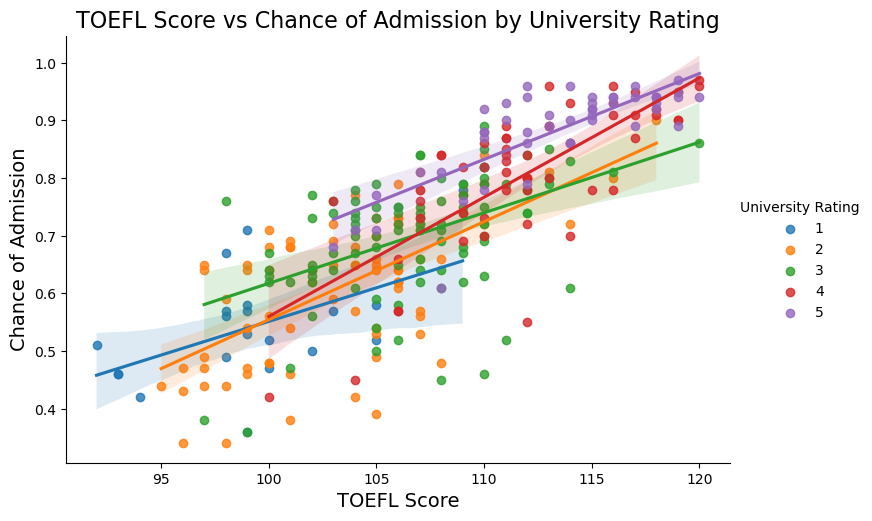

In [28]:
# Creating a scatterplot with regression line
sns.lmplot(x="TOEFL Score", y="Chance of Admit", data=Dataset, hue="University Rating", height=5, aspect=1.5)
plt.title('TOEFL Score vs Chance of Admission by University Rating', size=16)
plt.xlabel('TOEFL Score', size=14)
plt.ylabel('Chance of Admission', size=14)
plt.show()

CGPA

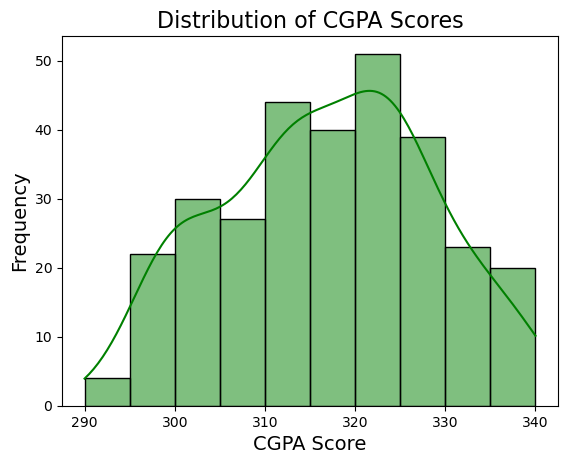

In [29]:
# Probability distribution plot
sns.histplot(data=gre, kde=True, color='green')
plt.title("Distribution of CGPA Scores", fontsize=16)
plt.xlabel("CGPA Score", fontsize=14)
plt.ylabel("Frequency", fontsize=14)
plt.show()

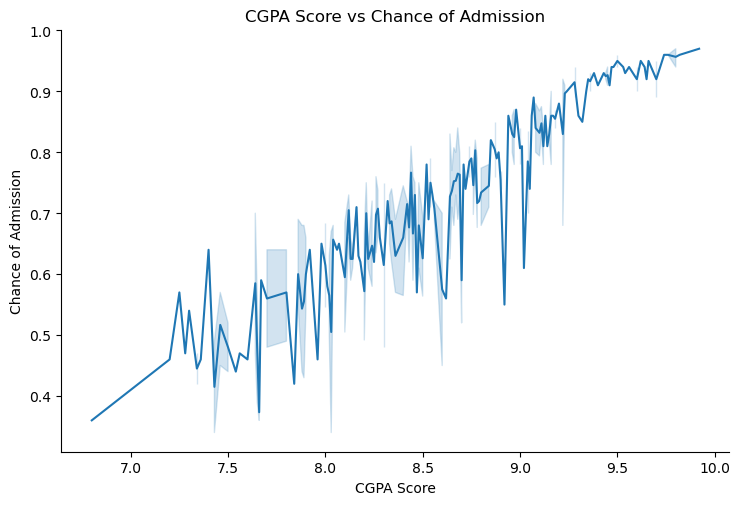

In [30]:
plot = sns.relplot(x="CGPA", y="Chance of Admit", data=Dataset, kind="line", height=5, aspect=1.5)
plot.set(title='CGPA Score vs Chance of Admission', xlabel='CGPA Score', ylabel='Chance of Admission')
plt.show()

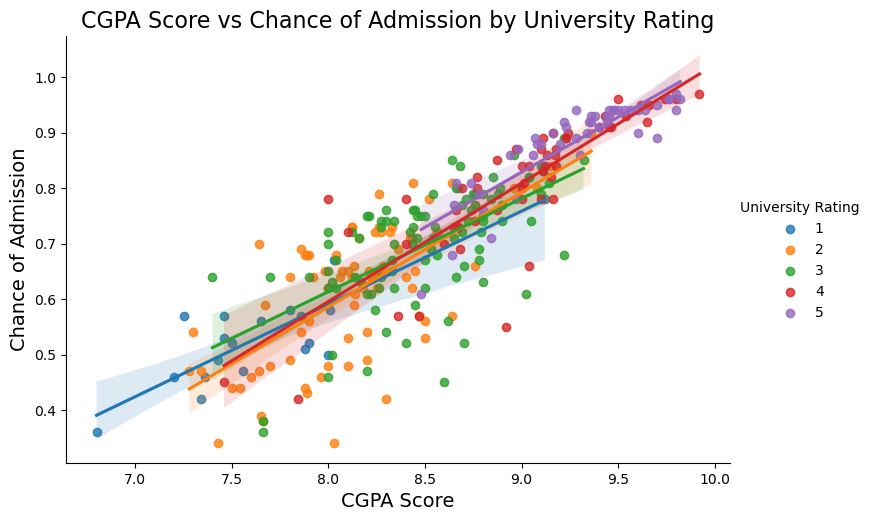

In [31]:
# Creating a scatterplot with regression line
sns.lmplot(x="CGPA", y="Chance of Admit", data=Dataset, hue="University Rating", height=5, aspect=1.5)
plt.title('CGPA Score vs Chance of Admission by University Rating', size=16)
plt.xlabel('CGPA Score', size=14)
plt.ylabel('Chance of Admission', size=14)
plt.show()

------

#### Analyzing the Dataset based on the LOR

In [32]:
LOR_counts = Dataset.groupby('LOR')['GRE Score'].count().reset_index(name='Count')
print(LOR_counts)


   LOR  Count
0  1.0      1
1  1.5      4
2  2.0     31
3  2.5     30
4  3.0     68
5  3.5     57
6  4.0     54
7  4.5     30
8  5.0     25


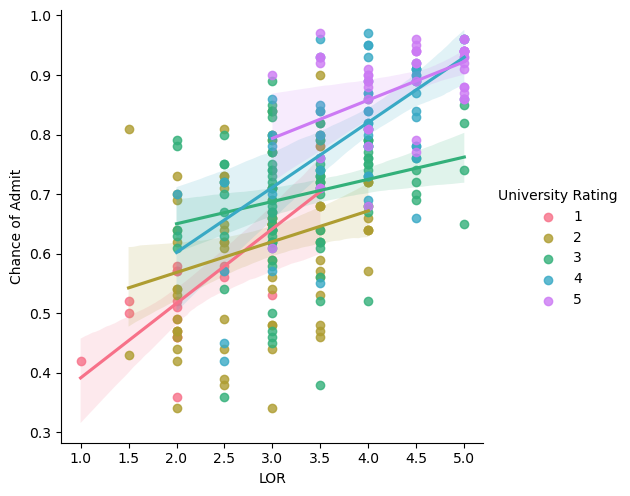

In [33]:
sns.pairplot(Dataset, x_vars=['LOR'], y_vars=['Chance of Admit'], kind='reg', height=5, aspect=1, hue='University Rating', palette='husl')
plt.show()


-------

#### Analyzing the Dataset based on the SOP

In [34]:
LOR_counts = Dataset.groupby('SOP')['GRE Score'].count().reset_index(name='Count')
print(LOR_counts)


   SOP  Count
0  1.0      4
1  1.5     16
2  2.0     30
3  2.5     28
4  3.0     51
5  3.5     52
6  4.0     54
7  4.5     40
8  5.0     25


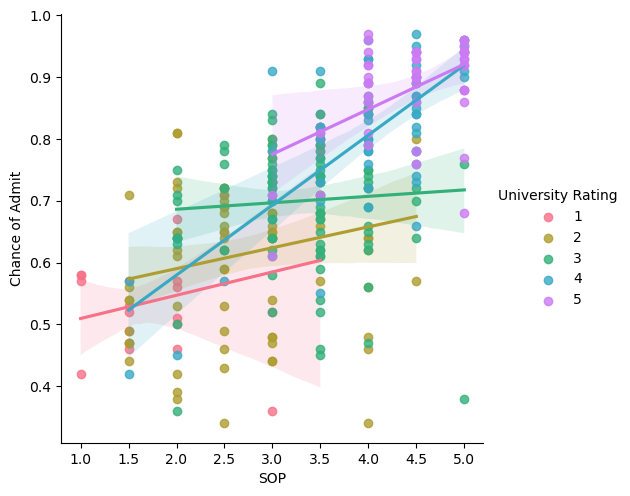

In [35]:
sns.pairplot(Dataset, x_vars=['SOP'], y_vars=['Chance of Admit'], kind='reg', height=5, aspect=1, hue='University Rating', palette='husl')
plt.show()


--------

#### Analyzing the University Rating

In [36]:
uni_counts = Dataset['University Rating'].value_counts().sort_index()
print(uni_counts)

1     20
2     78
3    100
4     54
5     48
Name: University Rating, dtype: int64


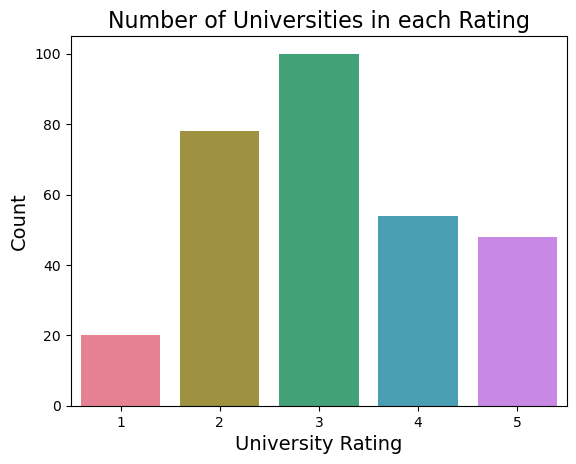

In [37]:
sns.countplot(x='University Rating', data=Dataset, palette='husl', order=[1, 2, 3, 4, 5])
plt.title('Number of Universities in each Rating', size=16)
plt.xlabel('University Rating', size=14)
plt.ylabel('Count', size=14)
plt.show()


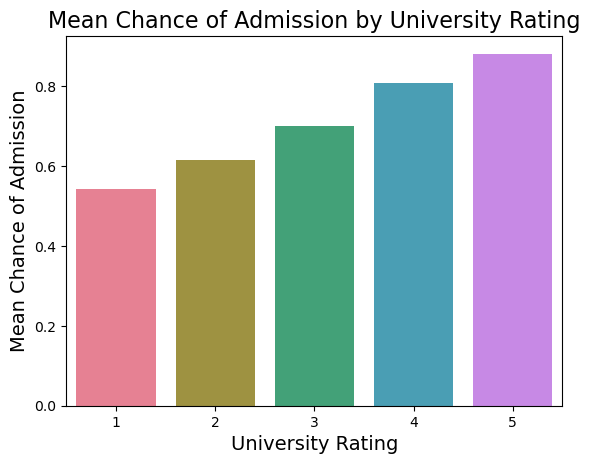

In [38]:
uni_chance = Dataset.groupby('University Rating')['Chance of Admit'].mean().reset_index()
sns.barplot(x='University Rating', y='Chance of Admit', data=uni_chance, palette='husl')
plt.title('Mean Chance of Admission by University Rating', size=16)
plt.xlabel('University Rating', size=14)
plt.ylabel('Mean Chance of Admission', size=14)
plt.show()

In [39]:
uni_chance

,University Rating,Chance of Admit
0,1,0.541500
1,2,0.615128
2,3,0.700200
3,4,0.807407
4,5,0.881458


------

----------

## Advanced Alayzing 

#### usign plotly express

In [40]:
# Scatter plot of Chance of Admit vs. GRE Score, colored by University Rating
fig = px.scatter(Dataset, x='GRE Score', y='Chance of Admit', color='University Rating',
                 title='Chance of Admission vs. GRE Score, colored by University Rating')
fig.show()

# Histogram of Chance of Admit, colored by University Rating
fig = px.histogram(Dataset, x='Chance of Admit', color='University Rating',
                   title='Distribution of Chance of Admission, colored by University Rating')
fig.show()

# Box plot of Chance of Admit, grouped by University Rating
fig = px.box(Dataset, x='University Rating', y='Chance of Admit', 
             title='Chance of Admission by University Rating')
fig.show()


In [41]:
# 3D scatter plot
fig = px.scatter_3d(Dataset, x='GRE Score', y='TOEFL Score', z='CGPA', 
                    color='Chance of Admit', size='Research', 
                    hover_name='University Rating', 
                    labels={'GRE Score': 'GRE Score', 
                            'TOEFL Score': 'TOEFL Score', 
                            'CGPA': 'CGPA', 
                            'Chance of Admit': 'Chance of Admit', 
                            'Research': 'Research', 
                            'University Rating': 'University Rating'})

# set title and axis labels
fig.update_layout(title='3D Scatter Plot of Admissions Data', 
                  scene=dict(xaxis_title='GRE Score', 
                             yaxis_title='TOEFL Score', 
                             zaxis_title='CGPA'))

# display plot
fig.show()


In [42]:
data = {'University': ['University 1', 'University 2', 'University 3', 'University 4', 'University 5'], 
        'Latitude': [23.6160, 23.5516, 23.5572, 23.5147, 23.5751], 
        'Longitude': [58.5336, 58.1819, 58.4327, 58.4206, 58.1920], 
        'Admission Rate': [0.548077, 0.625981, 0.711880, 0.818108, 0.888167]}

df = pd.DataFrame(data)

# plot the universities on a scatter plot
fig = px.scatter_mapbox(df, lat="Latitude", lon="Longitude", color="Admission Rate", size="Admission Rate",
                        hover_name="University", hover_data={'Admission Rate': ':.2f'}, zoom=9, height=500, 
                        mapbox_style="carto-positron")

fig.show()

-----

#### Using sweetviz

In [43]:
EDAReport = sv.analyze(Dataset)

                                             |          | [  0%]   00:00 -> (? left)

In [44]:
EDAReport.show_html(layout="vertical")

Report SWEETVIZ_REPORT.html was generated! NOTEBOOK/COLAB USERS: the web browser MAY not pop up, regardless, the report IS saved in your notebook/colab files.


In [45]:
EDAReport.show_html(layout="vertical")

Report SWEETVIZ_REPORT.html was generated! NOTEBOOK/COLAB USERS: the web browser MAY not pop up, regardless, the report IS saved in your notebook/colab files.



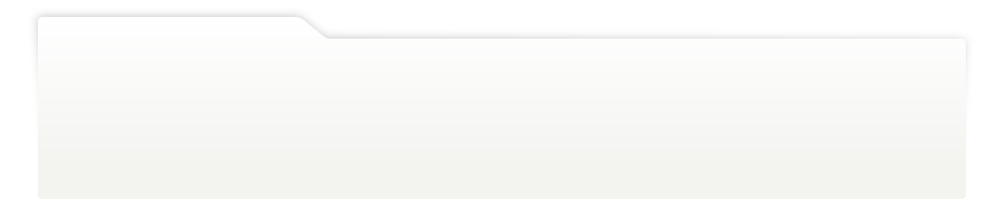
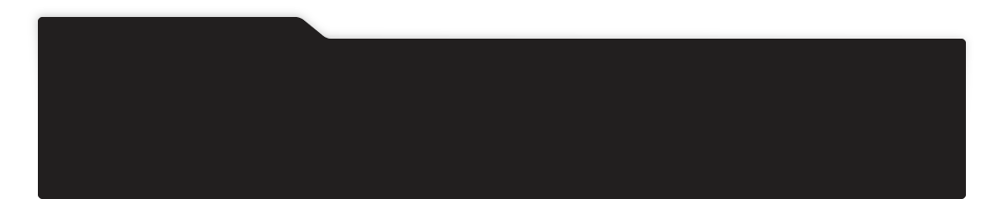
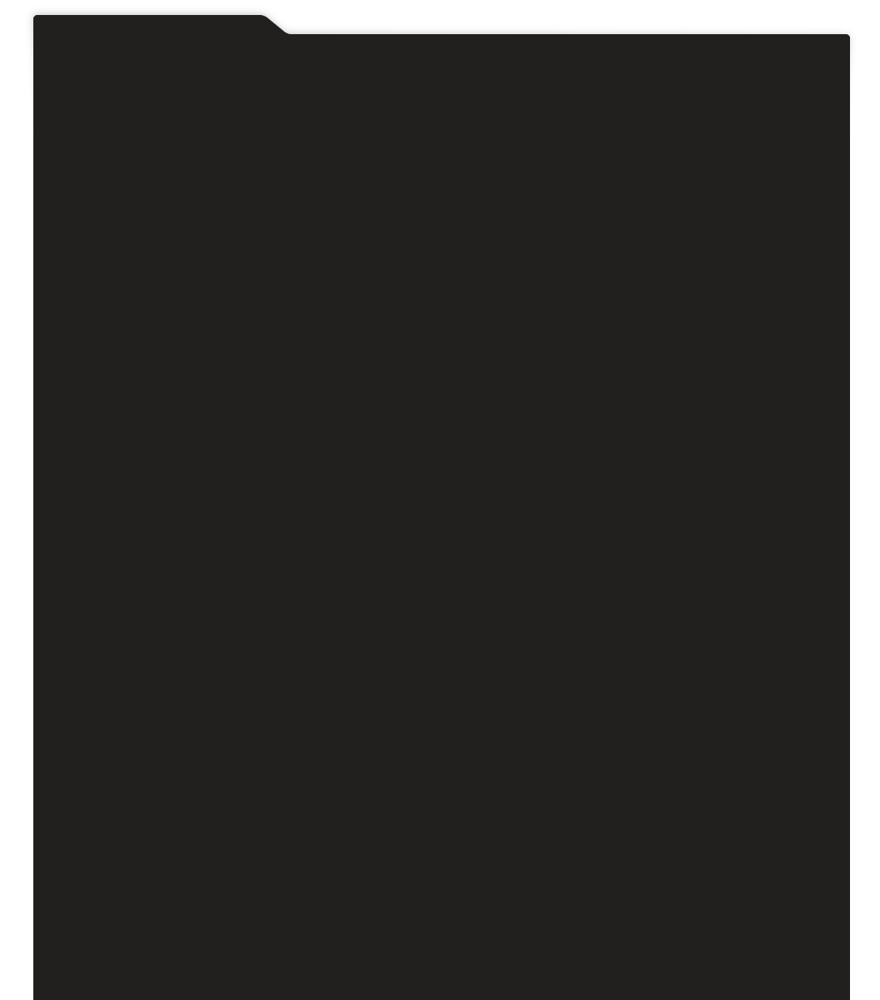
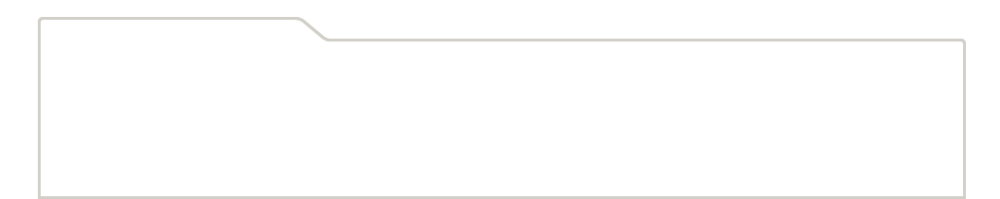
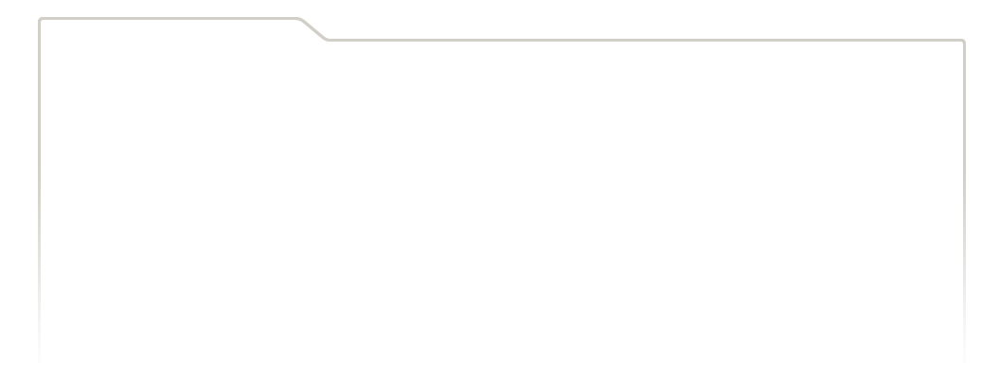
...
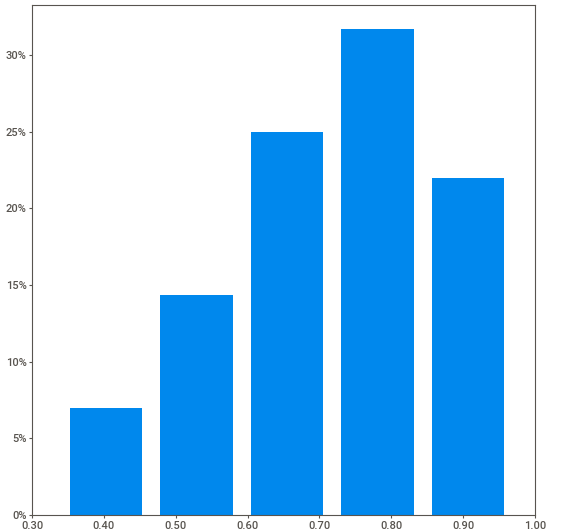
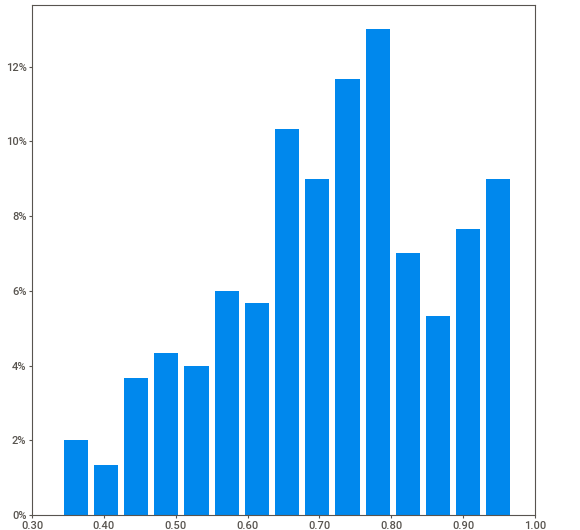
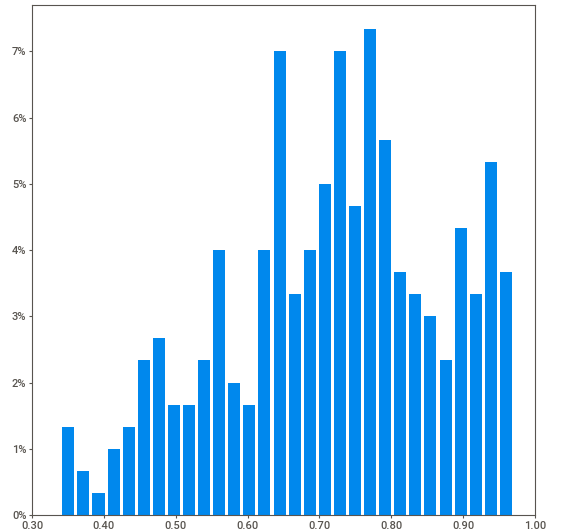
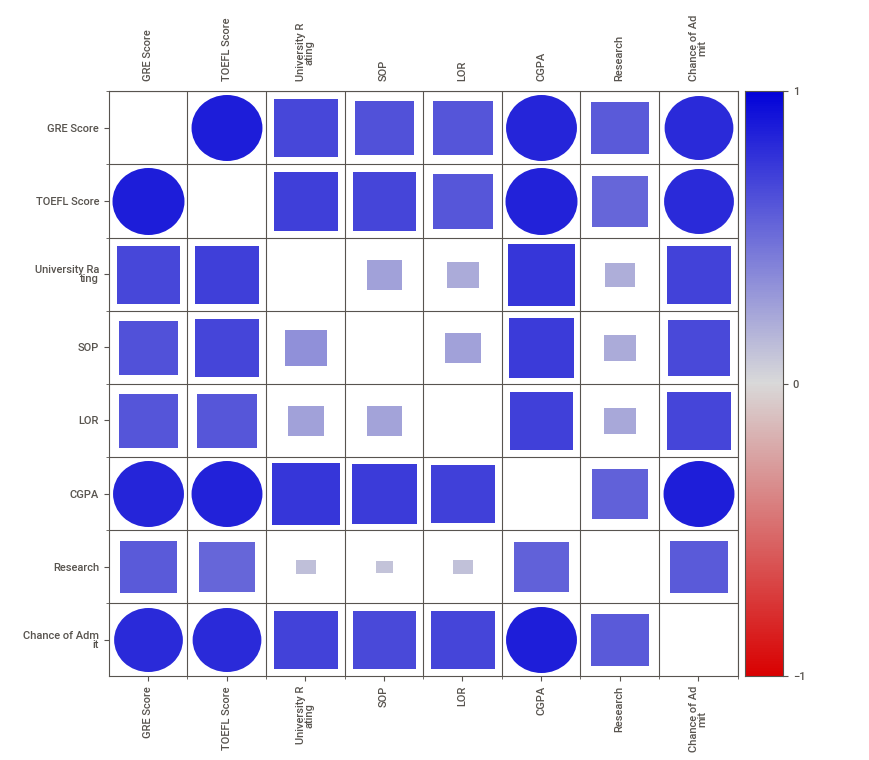
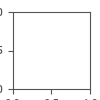

In [46]:
EDAReport.show_notebook()

-------

#### Profiling Report using pandas_profiling

In [47]:
from pandas_profiling import ProfileReport 

In [48]:
DataProfileReport = ProfileReport(Dataset)

In [49]:
DataProfileReport

Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

In [50]:
DataProfileReport.to_file('DataProfileReport',silent=False)

Export report to file:   0%|          | 0/1 [00:00<?, ?it/s]

----------------

-----------

### Test Dataset 

In this section, the test dataset is imported, cleaned and fast analyzed and prepared to be used in testing phases

In [51]:
# Import the CSV file
TestDataset = pd.read_csv('Dataset/TestingAdmission_PredictDataset.csv')

In [52]:
#Passing a value to carry the columns which will be dropped
columnsToDrop = ['Serial No.']

# Dropping the unneeded columns from axis 1 as its on the first line of the dataset
TestDataset = TestDataset.drop(columnsToDrop,axis=1)

#Since we have an empty space after 'Chance of Admit' and LOR, the names will be modified to fulfil the space

TestDataset.rename({'LOR ':'LOR'}, axis=1, inplace=True)

Analyzing

Text(0.5, 1.0, 'Correlation Heat Map')

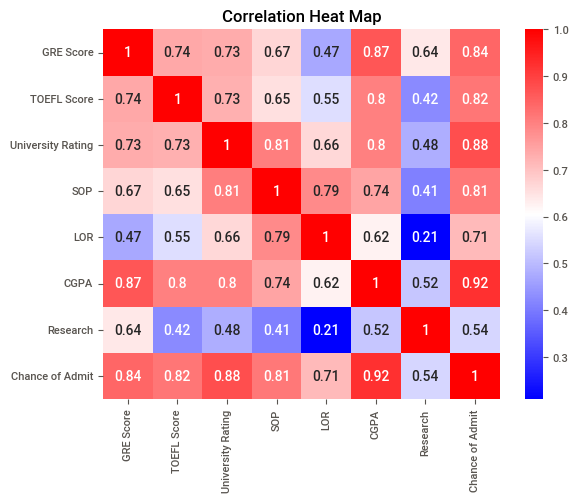

In [53]:
## Correlation heatmap
sns.heatmap(TestDataset.corr(), annot=True, cmap='bwr').set_title('Correlation Heat Map')

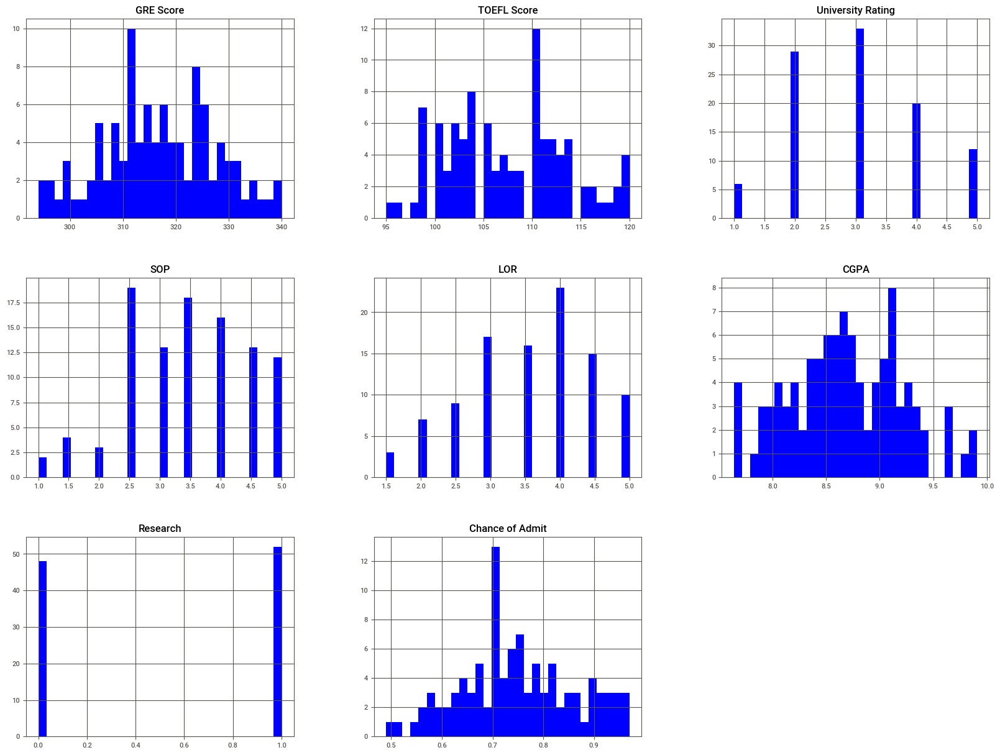

In [54]:
# Plot histograms of the features
TestDataset.hist(bins=30, figsize=(20,15), color='blue')
plt.show()

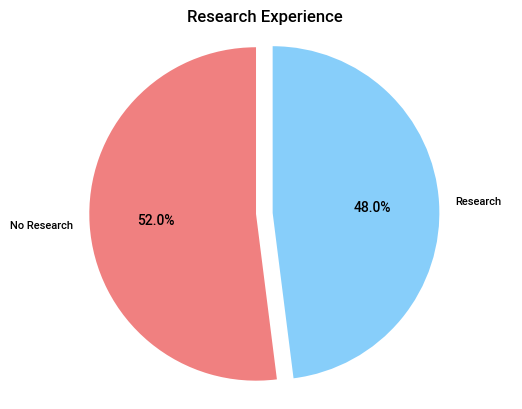

In [55]:
# Count the number of students who did and did not do research
research_count = TestDataset['Research'].value_counts()

# Create a pie chart showing the distribution of the 'Research' column
labels = ['No Research', 'Research']
sizes = research_count.values
colors = ['lightcoral', 'lightskyblue']
explode = (0, 0.1)

plt.pie(sizes, explode=explode, labels=labels, colors=colors,
        autopct='%1.1f%%', startangle=90)
plt.axis('equal')
plt.title('Research Experience')
plt.show()

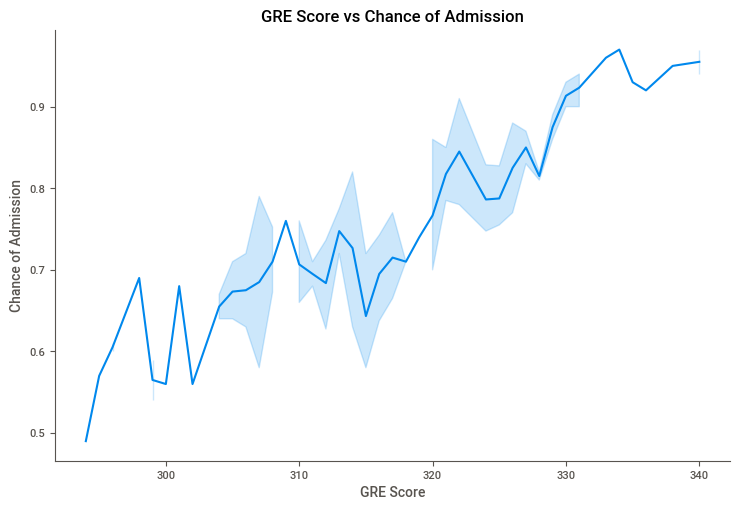

In [56]:
plot = sns.relplot(x="GRE Score", y="Chance of Admit", data=TestDataset, kind="line", height=5, aspect=1.5)
plot.set(title='GRE Score vs Chance of Admission', xlabel='GRE Score', ylabel='Chance of Admission')
plt.show()

In [57]:
#Set x and y

X1 = TestDataset.drop(["Chance of Admit"],axis=1)
y1 = TestDataset["Chance of Admit"].values

In [58]:
# separating train (80%) and test (%20) sets
X_train1, X_test1, y_train1, y_test1 = train_test_split(X1, y1, test_size = 0.20, random_state = 102)

In [59]:
#MinMaxScaler is applied to the training and testing data separately to ensure that the scaling is consistent 
#across both datasets. The fit_transform() method is used on the training set to compute the minimum and maximum 
#values of each feature and scale them accordingly.
#he transform() method is then applied to the testing set using the same scaling factors computed on the training set.

scalerX1 = MinMaxScaler(feature_range=(0, 1))
X_train1[X_train1.columns] = scalerX1.fit_transform(X_train1[X_train1.columns])
X_test1[X_test1.columns] = scalerX1.transform(X_test1[X_test1.columns])

In [60]:
y_train_02 = [1 if each > 0.8 else 0 for each in y_train1]
y_test_02  = [1 if each > 0.8 else 0 for each in y_test1]

# list to array
y_train_02 = np.array(y_train_02)
y_test_02 = np.array(y_test_02)

-----------------

## Machine Learning

#### Supervised Machine Learning

1. Decision Tree Classification
2. Random Forest Classification
3. Logistic Regression

Preparing Data for Training

In [61]:
#Set x and y
X = Dataset.drop(["Chance of Admit"],axis=1)
y = Dataset["Chance of Admit"].values

In [62]:
X.head(5)

,GRE Score,TOEFL Score,University Rating,SOP,LOR,CGPA,Research
0,337,118,4,4.5,4.5,9.65,1
1,324,107,4,4.0,4.5,8.87,1
2,316,104,3,3.0,3.5,8.00,1
3,322,110,3,3.5,2.5,8.67,1
4,314,103,2,2.0,3.0,8.21,0


In [63]:
y[:5]

array([0.92, 0.76, 0.72, 0.8 , 0.65])

In [64]:
# separating train (80%) and test (%20) sets
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size = 0.20, random_state = 100)

normalization


In [65]:
#MinMaxScaler is applied to the training and testing data separately to ensure that the scaling is consistent 
#across both datasets. The fit_transform() method is used on the training set to compute the minimum and maximum 
#values of each feature and scale them accordingly.
#he transform() method is then applied to the testing set using the same scaling factors computed on the training set.

scalerX = MinMaxScaler(feature_range=(0, 1))
X_train[X_train.columns] = scalerX.fit_transform(X_train[X_train.columns])
X_test[X_test.columns] = scalerX.transform(X_test[X_test.columns])

All students with a rating of > 80% will be marked as accepted [1]


and if the students achieve less than 80% the acceptance will be marked as not accepted [0]

In [66]:
y_train_01 = [1 if each > 0.8 else 0 for each in y_train]
y_test_01  = [1 if each > 0.8 else 0 for each in y_test]

# list to array
y_train_01 = np.array(y_train_01)
y_test_01 = np.array(y_test_01)

In [67]:
#Before
y_train

array([0.47, 0.76, 0.42, 0.78, 0.53, 0.59, 0.9 , 0.73, 0.64, 0.46, 0.73,
       0.91, 0.8 , 0.47, 0.65, 0.85, 0.74, 0.69, 0.73, 0.74, 0.57, 0.76,
       0.78, 0.76, 0.77, 0.43, 0.54, 0.74, 0.73, 0.8 , 0.62, 0.86, 0.38,
       0.91, 0.71, 0.89, 0.48, 0.94, 0.79, 0.93, 0.76, 0.74, 0.54, 0.81,
       0.79, 0.5 , 0.58, 0.47, 0.81, 0.71, 0.92, 0.85, 0.7 , 0.61, 0.59,
       0.81, 0.86, 0.53, 0.55, 0.72, 0.7 , 0.75, 0.82, 0.88, 0.66, 0.47,
       0.64, 0.94, 0.39, 0.89, 0.64, 0.84, 0.77, 0.93, 0.94, 0.45, 0.96,
       0.92, 0.87, 0.83, 0.74, 0.96, 0.72, 0.51, 0.79, 0.34, 0.46, 0.97,
       0.96, 0.58, 0.66, 0.77, 0.92, 0.64, 0.67, 0.94, 0.64, 0.79, 0.8 ,
       0.69, 0.84, 0.81, 0.78, 0.46, 0.91, 0.34, 0.89, 0.96, 0.75, 0.84,
       0.61, 0.95, 0.94, 0.64, 0.57, 0.68, 0.96, 0.78, 0.66, 0.88, 0.89,
       0.74, 0.88, 0.68, 0.74, 0.86, 0.82, 0.94, 0.7 , 0.56, 0.91, 0.48,
       0.84, 0.56, 0.57, 0.72, 0.78, 0.75, 0.68, 0.79, 0.7 , 0.63, 0.45,
       0.94, 0.68, 0.69, 0.76, 0.9 , 0.73, 0.79, 0.

In [68]:
#After
y_test_01

array([0, 0, 0, 0, 0, 1, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 1, 0, 1,
       0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 1, 0, 1, 0, 0, 1, 0, 0,
       0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 1, 0, 0, 0])

#### Decision Tree - Training

In [69]:
DecisionTree = DecisionTreeClassifier()
DecisionTree.fit(X_train, y_train_01)
y_pred_dtc = DecisionTree.predict(X_test)
accuracy = DecisionTree.score(X_test, y_test_01) * 100
print("Accuracy: {:.2f}%".format(accuracy))

Accuracy: 95.00%


In [70]:
DecisionTree.predict(X_test)

array([0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 1, 0, 0, 1, 0, 1,
       0, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 1, 0, 1, 0, 0, 1, 0, 0,
       0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 1, 0, 0, 0])

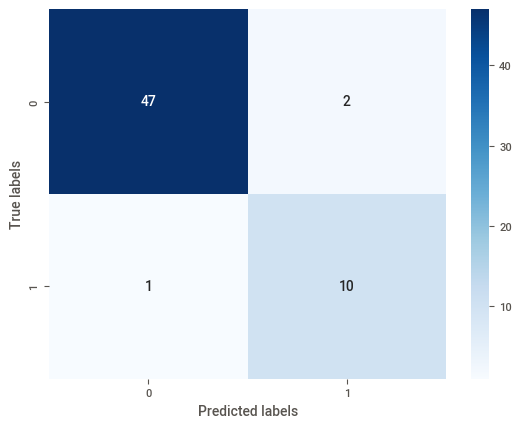

In [71]:
# calculate confusion matrix
cm = confusion_matrix(y_test_01, y_pred_dtc)

# plot confusion matrix
sns.heatmap(cm, annot=True, cmap='Blues')
plt.xlabel('Predicted labels')
plt.ylabel('True labels')
plt.show()

In [72]:
# get predicted values
y_pred = DecisionTree.predict(X_test)

# calculate true positives, false positives, false negatives, and true negatives
tn, fp, fn, tp = cm.ravel()
print("True positives (TP):", tp)
print("False positives (FP):", fp)
print("False negatives (FN):", fn)
print("True negatives (TN):", tn)


True positives (TP): 10
False positives (FP): 2
False negatives (FN): 1
True negatives (TN): 47


Saving the Tranind Model

In [73]:
# setting a name of the trained decision tree classifier file
decision_tree_pkl_filename = 'Saved_Model/decision_tree_classifier.pkl'

# Saving the classifier as pkl 
decision_tree_model_pkl = open(decision_tree_pkl_filename, 'wb')
pickle.dump(DecisionTree, decision_tree_model_pkl)

# Close the instances
decision_tree_model_pkl.close()

#### Decision Tree - Testing

Loading the saved model

In [74]:
# Loading the saved decision tree model
decision_tree_model_pkl = open(decision_tree_pkl_filename, 'rb')
DecisionTree_clf_loaded = pickle.load(decision_tree_model_pkl)
print ("Loaded Decision tree model : ", DecisionTree_clf_loaded)

Loaded Decision tree model :  DecisionTreeClassifier()


In [75]:
# get hyperparameters
params = DecisionTree_clf_loaded.get_params()
params

{'ccp_alpha': 0.0,
 'class_weight': None,
 'criterion': 'gini',
 'max_depth': None,
 'max_features': None,
 'max_leaf_nodes': None,
 'min_impurity_decrease': 0.0,
 'min_samples_leaf': 1,
 'min_samples_split': 2,
 'min_weight_fraction_leaf': 0.0,
 'random_state': None,
 'splitter': 'best'}

Testing

In [76]:
print(DecisionTree_clf_loaded.predict(X_test1))

[0 0 0 0 0 0 0 0 0 1 0 0 0 0 0 0 0 0 0 0]


In [77]:
cm_dtc_train = confusion_matrix(y_train_02, DecisionTree_clf_loaded.predict(X_train1))
accuracy = (cm_dtc_train[0, 0] + cm_dtc_train[1, 1]) / np.sum(cm_dtc_train) *100
print("Accuracy: {:.2f}%".format(accuracy))


Accuracy: 87.50%


-------

#### Random Forest - Training

In [78]:
RandomForest = RandomForestClassifier(n_estimators=100, random_state=1)
RandomForest.fit(X_train, y_train_01)

y_pred_rfc = RandomForest.predict(X_test)
print("Accuracy: {:.2f}%".format(RandomForest.score(X_test, y_test_01) * 100))

Accuracy: 91.67%


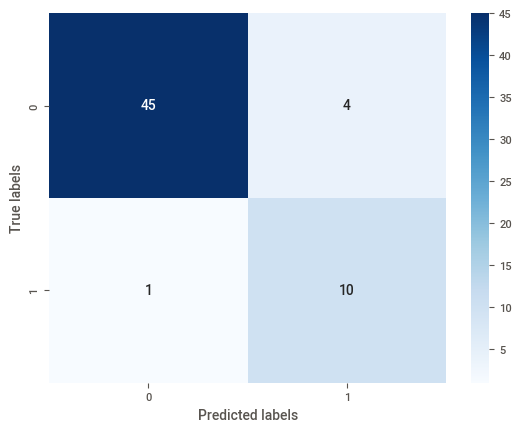

In [79]:
# calculate confusion matrix
cm = confusion_matrix(y_test_01, y_pred_rfc)

# plot confusion matrix
sns.heatmap(cm, annot=True, cmap='Blues')
plt.xlabel('Predicted labels')
plt.ylabel('True labels')
plt.show()

Saving The Model

In [80]:
RandomForest_pkl_filename = 'Saved_Model/RandomForestClassifier.pkl'

# Saving the classifier as pkl 
RandomForest_model_pkl = open(RandomForest_pkl_filename, 'wb')
pickle.dump(RandomForest, RandomForest_model_pkl)

# Close the instances
RandomForest_model_pkl.close()

#### Random Forest - Testing

Loading the saved model

In [81]:
# Loading the saved model
RandomForest_model_pkl = open(RandomForest_pkl_filename, 'rb')
RandomForest_clf_loaded = pickle.load(RandomForest_model_pkl)
print ("Loaded Random Forest model : ", RandomForest_clf_loaded)

Loaded Random Forest model :  RandomForestClassifier(random_state=1)


In [82]:
# get hyperparameters
params = RandomForest_clf_loaded.get_params()
params

{'bootstrap': True,
 'ccp_alpha': 0.0,
 'class_weight': None,
 'criterion': 'gini',
 'max_depth': None,
 'max_features': 'auto',
 'max_leaf_nodes': None,
 'max_samples': None,
 'min_impurity_decrease': 0.0,
 'min_samples_leaf': 1,
 'min_samples_split': 2,
 'min_weight_fraction_leaf': 0.0,
 'n_estimators': 100,
 'n_jobs': None,
 'oob_score': False,
 'random_state': 1,
 'verbose': 0,
 'warm_start': False}

In [83]:
print(RandomForest_clf_loaded.predict(X_test1))

[1 0 0 0 0 0 0 0 0 1 0 0 0 0 1 0 0 0 0 0]


In [84]:
cm_dtc_train = confusion_matrix(y_train_02, RandomForest_clf_loaded.predict(X_train1))
accuracy = (cm_dtc_train[0, 0] + cm_dtc_train[1, 1]) / np.sum(cm_dtc_train) *100
print("Accuracy: {:.2f}%".format(accuracy))

Accuracy: 91.25%


-------

#### Logistic Regression - Training

In [85]:
LogisticReg = LogisticRegression()
LogisticReg.fit(X_train,y_train_01)

LogisticRegression()

In [86]:
y_predlogr = LogisticReg.predict(X_test)

In [87]:
print("Accuracy: {:.2%}".format(accuracy_score(y_predlogr, y_test_01)))

Accuracy: 95.00%


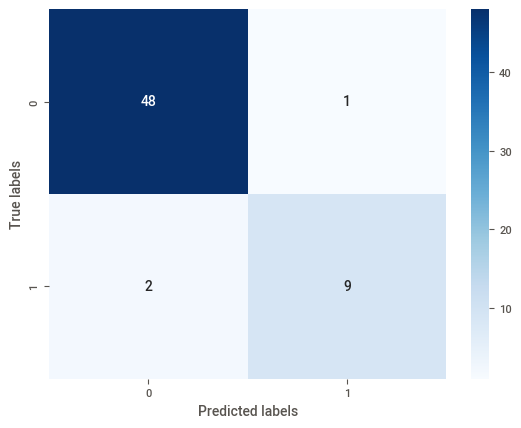

In [88]:
# calculate confusion matrix
cm = confusion_matrix(y_test_01, y_predlogr)

# plot confusion matrix
sns.heatmap(cm, annot=True, cmap='Blues')
plt.xlabel('Predicted labels')
plt.ylabel('True labels')
plt.show()

In [89]:

LR_pkl_filename = 'Saved_Model/LRtClassifier.pkl'

# Saving the classifier as pkl 
LR_model_pkl = open(LR_pkl_filename, 'wb')
pickle.dump(LogisticReg, LR_model_pkl)

# Close the instances
LR_model_pkl.close()

#### Logistic Regression - Testing

Loading the saved model

In [90]:
# Loading the saved model
LR_model_pkl = open(LR_pkl_filename, 'rb')
LR_loaded = pickle.load(LR_model_pkl)
print ("Loaded LR model : ", LR_loaded)

Loaded LR model :  LogisticRegression()


In [91]:
# get hyperparameters
params = LR_loaded.get_params()
params

{'C': 1.0,
 'class_weight': None,
 'dual': False,
 'fit_intercept': True,
 'intercept_scaling': 1,
 'l1_ratio': None,
 'max_iter': 100,
 'multi_class': 'auto',
 'n_jobs': None,
 'penalty': 'l2',
 'random_state': None,
 'solver': 'lbfgs',
 'tol': 0.0001,
 'verbose': 0,
 'warm_start': False}

In [92]:
print(LR_loaded.predict(X_test))

[0 0 0 0 0 1 0 0 0 0 0 0 0 0 0 0 1 0 0 1 0 1 0 0 0 0 0 0 0 0 0 0 0 0 0 1 1
 0 1 0 0 1 0 0 0 0 0 0 0 0 0 0 1 1 0 0 0 0 0 0]


In [93]:
cm_dtc_train = confusion_matrix(y_train_02, LR_loaded.predict(X_train1))
accuracy = (cm_dtc_train[0, 0] + cm_dtc_train[1, 1]) / np.sum(cm_dtc_train) *100
print("Accuracy: {:.2f}%".format(accuracy))

Accuracy: 91.25%


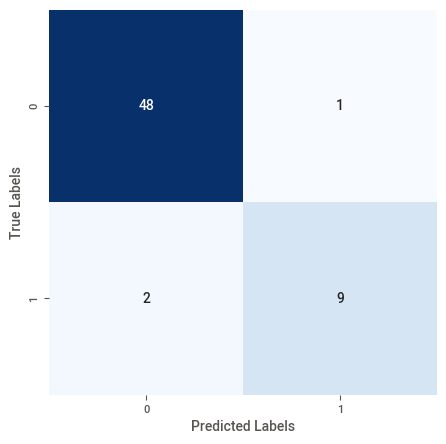

In [94]:
cm = confusion_matrix(y_test_01, y_predlogr)
plt.figure(figsize=(5,5))
sns.heatmap(cm, annot=True, cmap='Blues', fmt='g', cbar=False)
plt.xlabel('Predicted Labels')
plt.ylabel('True Labels')
plt.show()


---------

------

#### Neural Network

In [95]:
DataNN = pd.read_csv('Dataset/Admission_Predict.csv')
DataNN

,Serial No.,GRE Score,TOEFL Score,University Rating,SOP,LOR,CGPA,Research,Chance of Admit
0,1,337,118,4,4.5,4.5,9.65,1,0.92
1,2,324,107,4,4.0,4.5,8.87,1,0.76
2,3,316,104,3,3.0,3.5,8.00,1,0.72
3,4,322,110,3,3.5,2.5,8.67,1,0.80
4,5,314,103,2,2.0,3.0,8.21,0,0.65
...,...,...,...,...,...,...,...,...,...
295,396,324,110,3,3.5,3.5,9.04,1,0.82
296,397,325,107,3,3.0,3.5,9.11,1,0.84
297,398,330,116,4,5.0,4.5,9.45,1,0.91
298,399,312,103,3,3.5,4.0,8.78,0,0.67


In [96]:
# Converting the target variable into a categorical variable
threshold = 0.8
DataNN['Chance of Admit'] = (DataNN['Chance of Admit '] > threshold).astype(int)
columns_to_drop = ['Serial No.', 'Chance of Admit ']
DataNN.drop(columns=columns_to_drop, inplace=True)

In [97]:
DataNN

,GRE Score,TOEFL Score,University Rating,SOP,LOR,CGPA,Research,Chance of Admit
0,337,118,4,4.5,4.5,9.65,1,1
1,324,107,4,4.0,4.5,8.87,1,0
2,316,104,3,3.0,3.5,8.00,1,0
3,322,110,3,3.5,2.5,8.67,1,0
4,314,103,2,2.0,3.0,8.21,0,0
...,...,...,...,...,...,...,...,...
295,324,110,3,3.5,3.5,9.04,1,1
296,325,107,3,3.0,3.5,9.11,1,1
297,330,116,4,5.0,4.5,9.45,1,1
298,312,103,3,3.5,4.0,8.78,0,0


In [98]:
# Convert the 'Research' column to one-hot encoding
research_encoder = OneHotEncoder(sparse=False)
research_encoded = research_encoder.fit_transform(DataNN[['Research']])
research_columns = ['NoResearch', 'Research']
research_df = pd.DataFrame(research_encoded, columns=research_columns)
DataNN = pd.concat([DataNN, research_df], axis=1)

# Convert the 'University Rating' column to one-hot encoding
rating_encoder = OneHotEncoder(sparse=False)
rating_encoded = rating_encoder.fit_transform(DataNN[['University Rating']])
rating_columns = ['oneStartRating', 'twoStartRating', 'threeStartRating', 'fourStartRating', 'fiveStartRating']
rating_df = pd.DataFrame(rating_encoded, columns=rating_columns)
DataNN = pd.concat([DataNN, rating_df], axis=1)


In [99]:
DataNN

,GRE Score,TOEFL Score,University Rating,SOP,LOR,CGPA,Research,Chance of Admit,NoResearch,Research,oneStartRating,twoStartRating,threeStartRating,fourStartRating,fiveStartRating
0,337,118,4,4.5,4.5,9.65,1,1,0.0,1.0,0.0,0.0,0.0,1.0,0.0
1,324,107,4,4.0,4.5,8.87,1,0,0.0,1.0,0.0,0.0,0.0,1.0,0.0
2,316,104,3,3.0,3.5,8.00,1,0,0.0,1.0,0.0,0.0,1.0,0.0,0.0
3,322,110,3,3.5,2.5,8.67,1,0,0.0,1.0,0.0,0.0,1.0,0.0,0.0
4,314,103,2,2.0,3.0,8.21,0,0,1.0,0.0,0.0,1.0,0.0,0.0,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
295,324,110,3,3.5,3.5,9.04,1,1,0.0,1.0,0.0,0.0,1.0,0.0,0.0
296,325,107,3,3.0,3.5,9.11,1,1,0.0,1.0,0.0,0.0,1.0,0.0,0.0
297,330,116,4,5.0,4.5,9.45,1,1,0.0,1.0,0.0,0.0,0.0,1.0,0.0
298,312,103,3,3.5,4.0,8.78,0,0,1.0,0.0,0.0,0.0,1.0,0.0,0.0


In [100]:
# Scale the numerical variables
scaler = StandardScaler()
DataNN[['GRE Score', 'TOEFL Score', 'SOP', 'LOR ', 'CGPA']] = scaler.fit_transform(DataNN[['GRE Score', 'TOEFL Score', 'SOP', 'LOR ', 'CGPA']])

In [101]:
DataNN

,GRE Score,TOEFL Score,University Rating,SOP,LOR,CGPA,Research,Chance of Admit,NoResearch,Research,oneStartRating,twoStartRating,threeStartRating,fourStartRating,fiveStartRating
0,1.723330,1.749966,4,1.115031,1.226000,1.755753,1,1,0.0,1.0,0.0,0.0,0.0,1.0,0.0
1,0.614256,-0.066608,4,0.617249,1.226000,0.488335,1,0,0.0,1.0,0.0,0.0,0.0,1.0,0.0
2,-0.068251,-0.562037,3,-0.378314,0.099507,-0.925324,1,0,0.0,1.0,0.0,0.0,1.0,0.0,0.0
3,0.443630,0.428822,3,0.119468,-1.026986,0.163356,1,0,0.0,1.0,0.0,0.0,1.0,0.0,0.0
4,-0.238877,-0.727180,2,-1.373877,-0.463740,-0.584096,0,0,1.0,0.0,0.0,1.0,0.0,0.0,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
295,0.614256,0.428822,3,0.119468,0.099507,0.764567,1,1,0.0,1.0,0.0,0.0,1.0,0.0,0.0
296,0.699570,-0.066608,3,-0.378314,0.099507,0.878310,1,1,0.0,1.0,0.0,0.0,1.0,0.0,0.0
297,1.126137,1.419680,4,1.612812,1.226000,1.430774,1,1,0.0,1.0,0.0,0.0,0.0,1.0,0.0
298,-0.409504,-0.727180,3,0.119468,0.662753,0.342095,0,0,1.0,0.0,0.0,0.0,1.0,0.0,0.0


In [102]:
# Drop the original 'Research' and 'University Rating' columns
DataNN = DataNN.drop(['Research', 'University Rating'], axis=1)
DataNN

,GRE Score,TOEFL Score,SOP,LOR,CGPA,Chance of Admit,NoResearch,oneStartRating,twoStartRating,threeStartRating,fourStartRating,fiveStartRating
0,1.723330,1.749966,1.115031,1.226000,1.755753,1,0.0,0.0,0.0,0.0,1.0,0.0
1,0.614256,-0.066608,0.617249,1.226000,0.488335,0,0.0,0.0,0.0,0.0,1.0,0.0
2,-0.068251,-0.562037,-0.378314,0.099507,-0.925324,0,0.0,0.0,0.0,1.0,0.0,0.0
3,0.443630,0.428822,0.119468,-1.026986,0.163356,0,0.0,0.0,0.0,1.0,0.0,0.0
4,-0.238877,-0.727180,-1.373877,-0.463740,-0.584096,0,1.0,0.0,1.0,0.0,0.0,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...
295,0.614256,0.428822,0.119468,0.099507,0.764567,1,0.0,0.0,0.0,1.0,0.0,0.0
296,0.699570,-0.066608,-0.378314,0.099507,0.878310,1,0.0,0.0,0.0,1.0,0.0,0.0
297,1.126137,1.419680,1.612812,1.226000,1.430774,1,0.0,0.0,0.0,0.0,1.0,0.0
298,-0.409504,-0.727180,0.119468,0.662753,0.342095,0,1.0,0.0,0.0,1.0,0.0,0.0


In [103]:
# Split the data into training and testing sets
X = DataNN.drop(['Chance of Admit'], axis=1)
y = DataNN['Chance of Admit']
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

In [104]:
# Scale the numerical variables in the training set
scaler = StandardScaler()
X_train[['GRE Score', 'TOEFL Score', 'SOP', 'LOR ', 'CGPA']] = scaler.fit_transform(X_train[['GRE Score', 'TOEFL Score', 'SOP', 'LOR ', 'CGPA']])

# Scale the numerical variables in the test set
X_test[['GRE Score', 'TOEFL Score', 'SOP', 'LOR ', 'CGPA']] = scaler.transform(X_test[['GRE Score', 'TOEFL Score', 'SOP', 'LOR ', 'CGPA']])

In [105]:
# Define the model
model = Sequential()
model.add(Dense(128, activation='relu', input_shape=(X_train.shape[1],)))
model.add(Dropout(0.2))
model.add(Dense(64, activation='relu'))
model.add(Dropout(0.2))
model.add(Dense(1, activation='sigmoid'))

In [106]:
# Compile the model
model.compile(optimizer='adam', loss='binary_crossentropy', metrics=['accuracy'])
model.summary()

Model: "sequential"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 dense (Dense)               (None, 128)               1536      
                                                                 
 dropout (Dropout)           (None, 128)               0         
                                                                 
 dense_1 (Dense)             (None, 64)                8256      
                                                                 
 dropout_1 (Dropout)         (None, 64)                0         
                                                                 
 dense_2 (Dense)             (None, 1)                 65        
                                                                 
Total params: 9,857
Trainable params: 9,857
Non-trainable params: 0
_________________________________________________________________


In [107]:
history = model.fit(X_train, y_train, batch_size=64, epochs=150, validation_data=(X_test, y_test))

Epoch 1/150
4/4 [==============================] - 1s 55ms/step - loss: 0.6016 - accuracy: 0.7167 - val_loss: 0.5384 - val_accuracy: 0.8333
Epoch 2/150
4/4 [==============================] - 0s 8ms/step - loss: 0.5124 - accuracy: 0.8458 - val_loss: 0.4508 - val_accuracy: 0.9000
Epoch 3/150
4/4 [==============================] - 0s 7ms/step - loss: 0.4270 - accuracy: 0.8708 - val_loss: 0.3830 - val_accuracy: 0.9333
Epoch 4/150
4/4 [==============================] - 0s 7ms/step - loss: 0.3579 - accuracy: 0.8917 - val_loss: 0.3286 - val_accuracy: 0.9333
Epoch 5/150
4/4 [==============================] - 0s 7ms/step - loss: 0.3141 - accuracy: 0.8958 - val_loss: 0.2859 - val_accuracy: 0.9333
Epoch 6/150
4/4 [==============================] - 0s 7ms/step - loss: 0.2689 - accuracy: 0.9375 - val_loss: 0.2527 - val_accuracy: 0.9333
Epoch 7/150
4/4 [==============================] - 0s 7ms/step - loss: 0.2518 - accuracy: 0.9042 - val_loss: 0.2283 - val_accuracy: 0.9333
Epoch 8/150
4/4 [=========

4/4 [==============================] - 0s 7ms/step - loss: 0.0675 - accuracy: 0.9750 - val_loss: 0.3604 - val_accuracy: 0.8000
Epoch 118/150
4/4 [==============================] - 0s 7ms/step - loss: 0.0593 - accuracy: 0.9833 - val_loss: 0.3471 - val_accuracy: 0.8000
Epoch 119/150
4/4 [==============================] - 0s 7ms/step - loss: 0.0627 - accuracy: 0.9792 - val_loss: 0.3324 - val_accuracy: 0.8167
Epoch 120/150
4/4 [==============================] - 0s 7ms/step - loss: 0.0620 - accuracy: 0.9750 - val_loss: 0.3396 - val_accuracy: 0.8000
Epoch 121/150
4/4 [==============================] - 0s 7ms/step - loss: 0.0569 - accuracy: 0.9792 - val_loss: 0.3382 - val_accuracy: 0.8000
Epoch 122/150
4/4 [==============================] - 0s 7ms/step - loss: 0.0578 - accuracy: 0.9792 - val_loss: 0.3467 - val_accuracy: 0.8167
Epoch 123/150
4/4 [==============================] - 0s 7ms/step - loss: 0.0532 - accuracy: 0.9833 - val_loss: 0.3418 - val_accuracy: 0.8333
Epoch 124/150
4/4 [========

In [108]:
# Evaluate the model on the test set
test_loss, test_acc = model.evaluate(X_test, y_test)
print('Test accuracy:', test_acc)

2/2 [==============================] - 0s 3ms/step - loss: 0.4137 - accuracy: 0.8167
Test accuracy: 0.8166666626930237


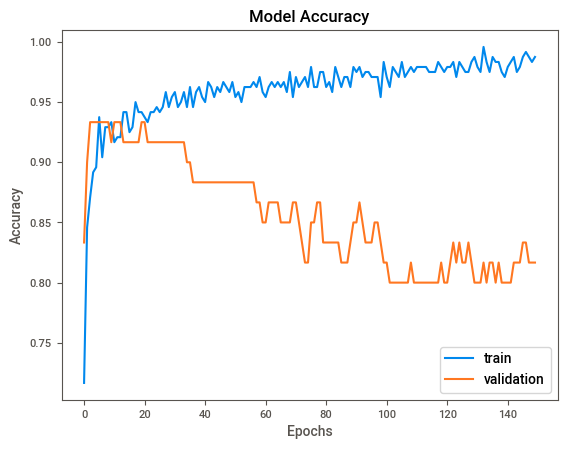

In [109]:
plt.plot(history.history['accuracy'])
plt.plot(history.history['val_accuracy'])
plt.title('Model Accuracy')
plt.xlabel('Epochs')
plt.ylabel('Accuracy')
plt.legend(['train', 'validation'], loc='lower right')
plt.show()

2/2 [==============================] - 0s 1000us/step
              precision    recall  f1-score   support

           0       0.86      0.88      0.87        41
           1       0.72      0.68      0.70        19

    accuracy                           0.82        60
   macro avg       0.79      0.78      0.79        60
weighted avg       0.81      0.82      0.82        60



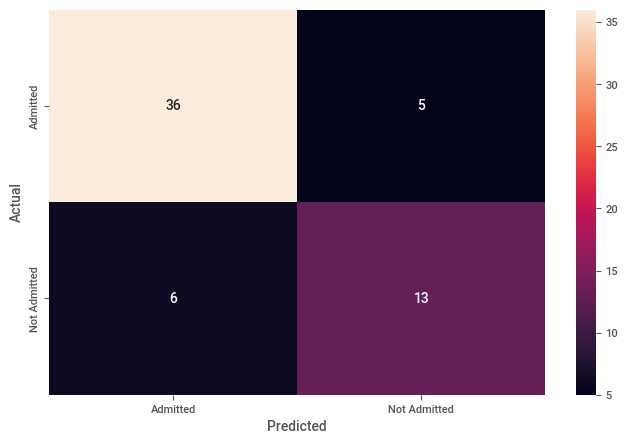

In [110]:
# Predict classes on the test set
test_pred = model.predict(X_test)
test_pred_classes = np.round(test_pred)

# Print classification report and confusion matrix
print(classification_report(y_test, test_pred_classes))
cm = confusion_matrix(y_test, test_pred_classes)
plt.figure(figsize=(8,5))
sns.heatmap(cm, annot=True,  fmt='.0f', xticklabels=['Admitted', 'Not Admitted'], yticklabels=['Admitted', 'Not Admitted'])
plt.ylabel('Actual')
plt.xlabel('Predicted')
plt.show()

Testing NN

In [111]:
DataNNTest = pd.read_csv('Dataset/Admission_Predict.csv')
DataNNTest

,Serial No.,GRE Score,TOEFL Score,University Rating,SOP,LOR,CGPA,Research,Chance of Admit
0,1,337,118,4,4.5,4.5,9.65,1,0.92
1,2,324,107,4,4.0,4.5,8.87,1,0.76
2,3,316,104,3,3.0,3.5,8.00,1,0.72
3,4,322,110,3,3.5,2.5,8.67,1,0.80
4,5,314,103,2,2.0,3.0,8.21,0,0.65
...,...,...,...,...,...,...,...,...,...
295,396,324,110,3,3.5,3.5,9.04,1,0.82
296,397,325,107,3,3.0,3.5,9.11,1,0.84
297,398,330,116,4,5.0,4.5,9.45,1,0.91
298,399,312,103,3,3.5,4.0,8.78,0,0.67


In [112]:
# Converting the target variable into a categorical variable
threshold = 0.8
DataNNTest['Chance of Admit'] = (DataNNTest['Chance of Admit '] > threshold).astype(int)
columns_to_drop = ['Serial No.', 'Chance of Admit ']
DataNNTest.drop(columns=columns_to_drop, inplace=True)

In [113]:
# Convert the 'Research' column to one-hot encoding
research_encoder = OneHotEncoder(sparse=False)
research_encoded = research_encoder.fit_transform(DataNNTest[['Research']])
research_columns = ['NoResearch', 'Research']
research_df = pd.DataFrame(research_encoded, columns=research_columns)
DataNNTest = pd.concat([DataNNTest, research_df], axis=1)



# Convert the 'University Rating' column to one-hot encoding
rating_encoder = OneHotEncoder(sparse=False)
rating_encoded = rating_encoder.fit_transform(DataNNTest[['University Rating']])
rating_columns = ['oneStartRating', 'twoStartRating', 'threeStartRating', 'fourStartRating', 'fiveStartRating']
rating_df = pd.DataFrame(rating_encoded, columns=rating_columns)
DataNNTest = pd.concat([DataNNTest, rating_df], axis=1)


# Scale the numerical variables
scaler = StandardScaler()
DataNNTest[['GRE Score', 'TOEFL Score', 'SOP', 'LOR ', 'CGPA']] = scaler.fit_transform(DataNNTest[['GRE Score', 'TOEFL Score', 'SOP', 'LOR ', 'CGPA']])
# Drop the original 'Research' and 'University Rating' columns
DataNNTest = DataNNTest.drop(['Research', 'University Rating'], axis=1)


# Split the data into training and testing sets
X = DataNNTest.drop(['Chance of Admit'], axis=1)
y = DataNNTest['Chance of Admit']
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)


# Scale the numerical variables in the training set
scaler = StandardScaler()
X_train[['GRE Score', 'TOEFL Score', 'SOP', 'LOR ', 'CGPA']] = scaler.fit_transform(X_train[['GRE Score', 'TOEFL Score', 'SOP', 'LOR ', 'CGPA']])

# Scale the numerical variables in the test set
X_test[['GRE Score', 'TOEFL Score', 'SOP', 'LOR ', 'CGPA']] = scaler.transform(X_test[['GRE Score', 'TOEFL Score', 'SOP', 'LOR ', 'CGPA']])

In [114]:
# Evaluate the model on the train set
train_loss, train_acc = model.evaluate(X_train, y_train)
print('Train accuracy:', train_acc)

8/8 [==============================] - 0s 1ms/step - loss: 0.0344 - accuracy: 0.9917
Train accuracy: 0.9916666746139526


------

### Multivariate Study

Linear Regression

In [138]:
from sklearn.model_selection import train_test_split, cross_val_score
from sklearn.linear_model import LinearRegression
from sklearn.metrics import r2_score

# Split the data into training and testing sets
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=102)

# Fit the linear regression model to the training data
reg = LinearRegression().fit(X_train, y_train)

# Predict the output variable using the test data
y_pred = reg.predict(X_test)

# Calculate R squared for the test data
r_squared = r2_score(y_test, y_pred)

print("Linear Regression R squared: ", r_squared)

Linear Regression R squared:  0.7590185078578513


Decision Tree

In [139]:
from sklearn.tree import DecisionTreeRegressor
from sklearn.metrics import r2_score

def train_decision_tree(X_train, y_train):
    # Instantiate the model
    dt = DecisionTreeRegressor()

    # Fit the model on training data
    dt.fit(X_train, y_train)

    return dt

def evaluate_decision_tree(dt, X_test, y_test):
    # Predict on test data
    y_pred = dt.predict(X_test)

    # Calculate R^2 score
    r2 = r2_score(y_test, y_pred)

    print("Decision Tree R squared: ", r2)
    
# Example usage:
dt = train_decision_tree(X_train, y_train)
evaluate_decision_tree(dt, X_test, y_test)


Decision Tree R squared:  0.625


Random Forest

In [140]:
from sklearn.ensemble import RandomForestRegressor
from sklearn.metrics import r2_score

# Instantiate the model
rf = RandomForestRegressor()

# Fit the model on training data
rf.fit(X_train, y_train)

# Predict on test data
y_pred = rf.predict(X_test)

# Calculate R^2 score
r2 = r2_score(y_test, y_pred)
print("Random Forest R squared: ", r2)

Random Forest R squared:  0.83428


Support Vector Regression

In [141]:
from sklearn.svm import SVR
from sklearn.metrics import r2_score

# Instantiate the model
svr = SVR()

# Fit the model on training data
svr.fit(X_train, y_train)

# Predict on test data
y_pred = svr.predict(X_test)

# Calculate R^2 score
r2 = r2_score(y_test, y_pred)
print("svr R squared: ", r2)

svr R squared:  0.8747372941860664


-----------

---------------

<b> Wassem A.A